In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import math

In [2]:
"""
1. Simulation Prep-functions
- Deriving formulas for option prices, Delta, Gamma.
- price: B-S equation
- Delta: partial derivatives with respect to S
- Gamma: partial... SS

2. Simulation
- Move-based vs. time-based
- flexibility to change measures i.e. P measure
- flexibility to switch bands

3. Metrics and Plots
- mean, median, std, VaR, CVaR
- KDE
- generate plots

...

Global parameters:
S0: asset price at t = 0
K: strike price
T_put: terminal time for put option
T_call: terminal time for call option
Ndt: time steps
r: risk-free rate
sigma_P: real-world sigma
sigma_Q: no-arbitrage sigma
mu: growth rate
Nsims: total simulation times
trans_cost_option: option transaction cost
trans_cost_asset: aseet transaction cost

Global functions:
CallPrice
PutPrice
CallDelta
PutDelta
Gamma
DeltaTimeHedge
GammaTimeHedge
DeltaMoveHedge
GammaMoveHedge
...
"""

'\n1. Simulation Prep-functions\n- Deriving formulas for option prices, Delta, Gamma.\n- price: B-S equation\n- Delta: partial derivatives with respect to S\n- Gamma: partial... SS\n\n2. Simulation\n- Move-based vs. time-based\n- flexibility to change measures i.e. P measure\n- flexibility to switch bands\n\n3. Metrics and Plots\n- mean, median, std, VaR, CVaR\n- KDE\n- generate plots\n\n...\n\nGlobal parameters:\nS0: asset price at t = 0\nK: strike price\nT_put: terminal time for put option\nT_call: terminal time for call option\nNdt: time steps\nr: risk-free rate\nsigma_P: real-world sigma\nsigma_Q: no-arbitrage sigma\nmu: growth rate\nNsims: total simulation times\ntrans_cost_option: option transaction cost\ntrans_cost_asset: aseet transaction cost\n\nGlobal functions:\nCallPrice\nPutPrice\nCallDelta\nPutDelta\nGamma\nDeltaTimeHedge\nGammaTimeHedge\nDeltaMoveHedge\nGammaMoveHedge\n...\n'

In [3]:
def CallPrice(S, K, tau, r, sigma):
    
    
    # Deriving d+ and d-
    dp = (np.log(S/K) + (r+0.5*sigma**2)*tau) / (sigma*np.sqrt(tau))
    dm = (np.log(S/K) + (r-0.5*sigma**2)*tau) / (sigma*np.sqrt(tau))
    
    # Obtain prices
    price = S*norm.cdf(dp) - K*np.exp(-r*tau)*norm.cdf(dm)
    
    return price

In [4]:
def PutPrice(S, K, tau, r, sigma):

    # Deriving d+ and d-
    dp = (np.log(S/K) + (r+0.5*sigma**2)*tau) / (sigma*np.sqrt(tau))
    dm = (np.log(S/K) + (r-0.5*sigma**2)*tau) / (sigma*np.sqrt(tau))
    
    # Obtain price
    price = K * np.exp(-r*tau)*norm.cdf(-dm) - S*norm.cdf(-dp)
    
    return price

In [5]:
def CallDelta(S, K, tau, r, sigma):
    
    dp = (np.log(S/K) + (r+0.5*sigma**2)*tau ) / (sigma*np.sqrt(tau))
    
    return norm.cdf(dp)

In [6]:
def PutDelta(S, K, tau, r, sigma):
    
    dp = (np.log(S/K) + (r+0.5*sigma**2)*tau ) / (sigma*np.sqrt(tau))
    
    return norm.cdf(dp)-1

In [7]:
def Gamma(S, K, tau, r, sigma):
    
    dp = (np.log(S/K) + (r+0.5*sigma**2)*tau ) / (sigma*np.sqrt(tau))
       
    g = norm.pdf(dp)/(S*sigma*np.sqrt(tau))
    
    return g

In [8]:
def DeltaTimeHedge(S0, mu, sigma_P, sigma_Q, r, K, T, Ndt, Nsims, trans_cost_asset):
    
    # obtain initial prices for options
    price_put = PutPrice(S0, K, T, r, sigma_Q)
    
    # Initialization, S - asset prices, Y - position on Bank account, alpha - position on equity, (gamma - position on option)
    #     Each row represents one simulation, where each entry represents status at different time
    #     -> Nsims rows, Ndt columns
    S = np.zeros((Nsims, Ndt+1))
    Y = np.zeros((Nsims, Ndt+1))
    alpha = np.zeros((Nsims, Ndt+1))
    
    #    Count total transaction cost
    total_trans_cost = np.zeros(Nsims)
    
    #    Fill in S0, alpha0, Y0, no-balance at T
    alpha[:,-1] = np.NaN
    S[:,0] = S0
    alpha[:,0] = PutDelta(S[:,0], K, T, r, sigma_Q)
    total_trans_cost  =  np.abs(alpha[:,0]) * trans_cost_asset
    Y[:,0] = price_put - alpha[:,0] * S[:,0] - total_trans_cost
    
    #    Create time spaces, obtain dt
    t = np.linspace(0, T, Ndt+1)
    dt = t[1] - t[0]
    
    #    Looping through time steps, make changes on t = i+1 based on t = i
    #     so starting at 0, ending at Ndt - 1, last changes are made on Ndt
    for i in range(Ndt):
        
        # Brownian Motion simulation at time i
        # Generate Nsims of them, since we compute on all simulations
        dW = np.sqrt(dt) * np.random.randn(Nsims)
        
        # Get asset prices using GBM, at i+1. Note asset prices are based on P measure (real-world measure)
        S[:, i+1] = S[:,i] * np.exp((mu-0.5*sigma_P**2)*dt + sigma_P*dW )
        
        # REBALANCE STEP
        #     rebalance on all time except for T, so last changes make on Ndt - 1, i.e. i = Ndt - 2
        if i < Ndt - 1:
            
            # compute alpha based on Q measure, tau = time to maturity
            alpha[:,i+1] = PutDelta(S[:,i+1], K, T-t[i+1], r, sigma_Q)
            
            # compute transaction cost, accumulate total transaction cost
            cost_transaction = trans_cost_asset*np.abs(alpha[:,i+1] - alpha[:,i])
            total_trans_cost += cost_transaction
            
            # Bank account accumunlated by risk-free rate, then pay for rebalance cost 
            Y[:,i+1] = Y[:,i] * np.exp(r*dt) - (alpha[:,i+1] - alpha[:,i]) * S[:,i+1] - cost_transaction
            
    # Now time is at T
    
    # compute terminal payoff owe to client, note the client will exercise only when payoff is positive
    payoff = K - S[:,-1]
    payoff[payoff<0] = 0
    
    # liquidate assets (and options, if owned)
    cost_transaction = np.abs(alpha[:,-2]) * trans_cost_asset
    Y[:,-1] = Y[:,-2]* np.exp(r*dt) + alpha[:,-2] * S[:,-1] - cost_transaction
    total_trans_cost += cost_transaction
    
    # Compute PnL and BV
    # PnL - profit and loss
    # BV - book value
    PnL = Y[:,-1] - payoff
    BV = Y + S * alpha
    BV[:,-1] = Y[:,-1]
    
    # return everything
    return t, S, Y, alpha, BV, PnL, total_trans_cost

In [9]:
def DeltaMoveHedge(S0, mu, sigma_P, sigma_Q, r, K, T, Ndt, Nsims, trans_cost_asset, band):
    
    # NOTE: move-based hedge has an additional parameter called band
    
    # obtain initial prices for options
    price_put = PutPrice(S0, K, T, r, sigma_Q)
    
    # Initialization, S - asset prices, Y - position on Bank account, alpha - position on equity, (gamma - position on option)
    #     Each row represents one simulation, where each entry represents status at different time
    #     -> Nsims rows, Ndt columns
    S = np.zeros((Nsims, Ndt+1))
    Y = np.zeros((Nsims, Ndt+1))
    alpha = np.zeros((Nsims, Ndt+1))
    
    #    Count total transaction cost
    total_trans_cost = np.zeros(Nsims)
    
    #    Fill in S0, alpha0, Y0, no-balance at T
    alpha[:,-1] = np.NaN
    S[:,0] = S0
    alpha[:,0] = PutDelta(S[:,0], K, T, r, sigma_Q)
    total_trans_cost  =  np.abs(alpha[:,0]) * trans_cost_asset
    Y[:,0] = 1 * price_put - alpha[:,0] * S[:,0] - total_trans_cost
    
    
    
    # compute boundary
    upper_b = alpha[:,0] + band
    lower_b = alpha[:,0] - band
    
    #    Create time spaces, obtain dt
    t = np.linspace(0, T, Ndt+1)
    dt = t[1] - t[0]
    
    """
    #    Looping through time steps, make changes on t = i+1 based on t = i
    #     so starting at 0, ending at Ndt - 1, last changes are made on Ndt
    
    !!Note: hard to operate on all columns to dynamically update boundaries - this part will be left incomplete for potential 
          solutions, instead, I will do a double loop to iterate over all entries.
    
    for i in range(Ndt):
        
        # Brownian Motion simulation at time i
        # Generate Nsims of them, since we compute on all simulations
        dW = np.sqrt(dt) * np.random.randn(Nsims)
        
        # Get asset prices using GBM, at i+1. Note asset prices are based on P measure (real-world measure)
        S[:, i+1] = S[:,i] * np.exp((mu-0.5*sigma_P**2)*dt + sigma_P*dW )
        
        # REBALANCE STEP
        # rebalance when delta went beyond boundaries
    """
    
    # ITERATE OVER ALL ENTRIES
    
    for i in range(Ndt):
        
        # simulate brownian motion at time i+1
        dW = np.sqrt(dt) * np.random.randn(Nsims)
        
        # generate asset prices at time i+1
        S[:,i+1] = S[:,i] * np.exp((mu-0.5*sigma_P**2)*dt + sigma_P*dW )
        
        # Now set alpha at i+1 = alpha at i, assuming no rebalance, and change it later
        alpha[:,i+1] = alpha[:,i]
        
        # REBALANCE STEP:
        # detect if delta hits the boundary at any simulation paths, so iterate over all sim paths.
        if i < Ndt - 1:
            # compute delta, #Nsims of them
            delta = PutDelta(S[:,i+1], K, T-t[i+1], r, sigma_Q)
            
            for j in range(Nsims):
                # check if rebalance is needed, i.e. check if delta hits boundaries
                if delta[j] >= -0.01:
                    alpha[j,i+1] = -0.01
                    upper_b[j] = -0.01 + band
                    lower_b[j] = -0.01 - band
                elif delta[j] <= -0.99:
                    alpha[j,i+1] = -0.99
                    upper_b[j] = -0.99 + band
                    lower_b[j] = -0.99 - band
                elif delta[j] >= upper_b[j] or delta[j] <= lower_b[j]:
                    alpha[j,i+1] = delta[j]
                    upper_b[j] = delta[j] + band
                    lower_b[j] = delta[j] - band
                    # AT here, record tau[j,i] if needed, where tau could be the matrix storing rebalance point
        
        # Record cost of transaction
        cost_transaction = trans_cost_asset*np.abs(alpha[:,i+1] - alpha[:,i])
        total_trans_cost += cost_transaction
        
        # Now update bank account, according to alpha[:,i+1]
        Y[:,i+1] = Y[:,i] * np.exp(r*dt) - (alpha[:,i+1] - alpha[:,i]) * S[:,i+1] - cost_transaction
        
        
    # Now time is at T
    
    # compute terminal payoff owe to client, note the client will exercise only when payoff is positive
    payoff = K - S[:,-1]
    payoff[payoff<0] = 0
    
    # liquidate assets (and options, if owned)
    cost_transaction =  np.abs(alpha[:,-2]) * trans_cost_asset
    Y[:,-1] = Y[:,-2]* np.exp(r*dt) + alpha[:,-2] * S[:,-1] - cost_transaction
    total_trans_cost += cost_transaction
    
    # Compute PnL and BV
    # PnL - profit and loss
    # BV - book value
    PnL = Y[:,-1] - payoff
    BV = Y + S * alpha
    BV[:,-1] = Y[:,-1]
    
    # return everything
    return t, S, Y, alpha, BV, PnL, total_trans_cost

In [10]:
def GammaTimeHedge(S0, mu, sigma_P, sigma_Q, r, K, T, T_call, Ndt, Nsims, trans_cost_asset, trans_cost_option):
    
    # obtain initial prices for options
    price_put = PutPrice(S0, K, T, r, sigma_Q)
    price_call = CallPrice(S0, K, T_call, r, sigma_Q)
    
    # Initialization, S - asset prices, Y - position on Bank account, alpha - position on equity, (gamma - position on option)
    #     Each row represents one simulation, where each entry represents status at different time
    #     -> Nsims rows, Ndt columns
    S = np.zeros((Nsims, Ndt+1))
    Y = np.zeros((Nsims, Ndt+1))
    alpha = np.zeros((Nsims, Ndt+1))
    gamma = np.zeros((Nsims, Ndt+1))
    
    #    Count total transaction cost
    total_trans_cost = np.zeros(Nsims)
    
    #    Store the price of call option here
    f = np.zeros((Nsims, Ndt+1))
    
    #    Fill in S0, alpha0, gamma0, Y0, no-balance at T
    alpha[:,-1] = np.NaN
    gamma[:,-1] = np.NaN
    S[:,0] = S0
    f[:,0] = CallPrice(S[:,0], K, T_call, r, sigma_Q)
    gamma[:,0] = Gamma(S[:,0], K, T, r, sigma_Q)/Gamma(S[:,0], K, T_call, r, sigma_Q)
    alpha[:,0] = PutDelta(S[:,0], K, T, r, sigma_Q) - gamma[:,0] * CallDelta(S[:,0], K, T_call, r, sigma_Q)
    total_trans_cost = np.abs(alpha[:,0]) * trans_cost_asset + np.abs(gamma[:,0]) * trans_cost_option
    Y[:,0] = 1 * price_put - alpha[:,0] * S[:,0]- gamma[:,0] * price_call - total_trans_cost
    
    
    #    Create time spaces, obtain dt
    t = np.linspace(0, T, Ndt+1)
    dt = t[1] - t[0]
    
    #    Looping through time steps, make changes on t = i+1 based on t = i
    #     so starting at 0, ending at Ndt - 1, last changes are made on Ndt
    for i in range(Ndt):
        
        # Brownian Motion simulation at time i
        # Generate Nsims of them, since we compute on all simulations
        dW = np.sqrt(dt) * np.random.randn(Nsims)
        
        # Get asset prices using GBM, at i+1. Note asset prices are based on P measure (real-world measure)
        S[:, i+1] = S[:,i] * np.exp((mu-0.5*sigma_P**2)*dt + sigma_P*dW )
        
        # Get price of call option
        f[:, i+1] = CallPrice(S[:,i+1], K, T_call, r, sigma_Q)
        
        # REBALANCE STEP
        #     rebalance on all time except for T, so last changes make on Ndt - 1, i.e. i = Ndt - 2
        if i < Ndt - 1:
            
            # compute gamma, alpha based on Q measure, tau = time to maturity
            gamma[:,i+1] = Gamma(S[:,i+1], K, T-t[i+1], r, sigma_Q)/Gamma(S[:,i+1], K, T_call-t[i+1], r, sigma_Q)
            alpha[:,i+1] = PutDelta(S[:,i+1], K, T-t[i+1], r, sigma_Q) - gamma[:, i+1] * CallDelta(S[:,i+1], K, T_call-t[i+1], r, sigma_Q)
            
            cost_transaction = trans_cost_asset*np.abs(alpha[:,i+1] - alpha[:,i]) + trans_cost_option*np.abs(gamma[:,i+1] - gamma[:,i])
            total_trans_cost += cost_transaction
            # Bank account accumunlated by risk-free rate, then pay for rebalance cost 
            Y[:,i+1] = Y[:,i] * np.exp(r*dt) - (alpha[:,i+1] - alpha[:,i]) * S[:,i+1] - \
                        (gamma[:,i+1] - gamma[:,i]) * f[:,i+1] - cost_transaction
            
       # Now time is at T
    
    # compute terminal payoff owe to client, note the client will exercise only when payoff is positive
    payoff = K - S[:,-1]
    payoff[payoff<0] = 0
    
    # liquidate assets (and options, if owned)
    cost_transaction = np.abs(alpha[:,-2]) * trans_cost_asset + np.abs(gamma[:,-2]) * trans_cost_option
    total_trans_cost += cost_transaction
    Y[:,-1] = Y[:,-2]* np.exp(r*dt) + alpha[:,-2] * S[:,-1] + gamma[:,-2] * f[:,-1] \
                - cost_transaction
    
    # Compute PnL and BV
    # PnL - profit and loss
    # BV - book value
    PnL = Y[:,-1] - payoff
    BV = Y + S * alpha + f * gamma
    BV[:,-1] = Y[:,-1]
    
    # return everything
    return t, S, Y, alpha, gamma, BV, PnL, total_trans_cost

In [46]:
def GammaMoveHedge(S0, mu, sigma_P, sigma_Q, r, K, T, T_call, Ndt, Nsims, trans_cost_asset, trans_cost_option, band):
    # obtain initial prices for options
    price_put = PutPrice(S0, K, T, r, sigma_Q)
    price_call = CallPrice(S0, K, T_call, r, sigma_Q)
    
    # Initialization, S - asset prices, Y - position on Bank account, alpha - position on equity, (gamma - position on option)
    #     Each row represents one simulation, where each entry represents status at different time
    #     -> Nsims rows, Ndt columns
    S = np.zeros((Nsims, Ndt+1))
    Y = np.zeros((Nsims, Ndt+1))
    alpha = np.zeros((Nsims, Ndt+1))
    gamma = np.zeros((Nsims, Ndt+1))
    
    #    Count total transaction cost
    total_trans_cost = np.zeros(Nsims)
    
    #    Store the price of call option here
    f = np.zeros((Nsims, Ndt+1))
    
    #    Fill in S0, alpha0, gamma0, Y0, no-balance at T
    alpha[:,-1] = np.NaN
    gamma[:,-1] = np.NaN
    S[:,0] = S0
    f[:,0] = CallPrice(S[:,0], K, T_call, r, sigma_Q)
    gamma[:,0] = Gamma(S[:,0], K, T, r, sigma_Q)/Gamma(S[:,0], K, T_call, r, sigma_Q)
    alpha[:,0] = PutDelta(S[:,0], K, T, r, sigma_Q) - gamma[:,0] * CallDelta(S[:,0], K, T_call, r, sigma_Q)
    total_trans_cost = np.abs(alpha[:,0]) * trans_cost_asset + np.abs(gamma[:,0]) * trans_cost_option
    Y[:,0] = 1 * price_put - alpha[:,0] * S[:,0] - gamma[:,0] * price_call - total_trans_cost
    
    # Initialized upper bound and lower bound
    upper_b = alpha[:,0] + band
    lower_b = alpha[:,0] - band
    
    #    Create time spaces, obtain dt
    t = np.linspace(0, T, Ndt+1)
    dt = t[1] - t[0]
    
    #    Looping through time steps, make changes on t = i+1 based on t = i
    #     so starting at 0, ending at Ndt - 1, last changes are made on Ndt
    for i in range(Ndt):
        
        # Brownian Motion simulation at time i
        # Generate Nsims of them, since we compute on all simulations
        dW = np.sqrt(dt) * np.random.randn(Nsims)
        
        # Get asset prices using GBM, at i+1. Note asset prices are based on P measure (real-world measure)
        S[:, i+1] = S[:,i] * np.exp((mu-0.5*sigma_P**2)*dt + sigma_P*dW )
        
        # Get call option price
        f[:,i+1] = CallPrice(S[:,i+1], K, T_call-t[i+1], r, sigma_Q)
        
        # REBALANCE STEP
        #     rebalance only when we see alpha reaches boundary, then update the boundary.
        if i < Ndt - 1:
            
            # update alpha and gamma for now, and check if we actually going to update it (accept)
            gamma[:,i+1] = Gamma(S[:,i+1], K, T-t[i+1], r, sigma_Q)/Gamma(S[:,i+1], K, T_call-t[i+1], r, sigma_Q)
            
            alpha[:,i+1] = PutDelta(S[:,i+1], K, T-t[i+1], r, sigma_Q) - gamma[:, i+1] * CallDelta(S[:,i+1], K, T_call-t[i+1], r, sigma_Q)
            
            for j in range(Nsims):
                
                # if in the band, the don't accept
                if ((lower_b[j] <= alpha[j,i+1] <= upper_b[j]) and alpha[j,i+1] < -0.01):
                    alpha[j,i+1] = alpha[j,i]
                    gamma[j,i+1] = gamma[j,i]
                # otherwise accept, and propose new bounds
                else:
                    upper_b[j] = alpha[j, i+1] + band
                    lower_b[j] = alpha[j, i+1] - band
            
            cost_transaction = trans_cost_asset*np.abs(alpha[:,i+1] - alpha[:,i]) + trans_cost_option*np.abs(gamma[:,i+1] - gamma[:,i])
            total_trans_cost += cost_transaction
            # accumulate bank account, and minus all transaction costs & payment
            Y[:,i+1] = Y[:,i] * np.exp(r*dt) - (alpha[:,i+1] - alpha[:,i]) * S[:,i+1] - \
                        (gamma[:,i+1] - gamma[:,i]) * f[:,i+1] - cost_transaction
            
                
            
       # Now time is at T
    
    # compute terminal payoff owe to client, note the client will exercise only when payoff is positive
    payoff = K - S[:,-1]
    payoff[payoff<0] = 0
    
    
    # liquidate assets (and options, if owned)
    cost_transaction = np.abs(alpha[:,-2]) * trans_cost_asset + np.abs(gamma[:,-2]) * trans_cost_option
    total_trans_cost += cost_transaction
    Y[:,-1] = Y[:,-2]* np.exp(r*dt) + alpha[:,-2] * S[:,-1] + gamma[:,-2] * f[:,-1] - cost_transaction
    
    # Compute PnL and BV
    # PnL - profit and loss
    # BV - book value
    PnL = Y[:,-1] - payoff
    BV = Y + S * alpha + f * gamma
    BV[:,-1] = Y[:,-1]
    
    # return everything
    return t, S, Y, alpha, gamma, BV, PnL,total_trans_cost
    


In [12]:
def KDE(data, z, fac=1):
    
    h = 1.069*np.std(data)* (data.shape[0])**(-1/5) * fac
    
    pdf = np.zeros(z.shape[0])
    
    ndata = data.shape[0]
    
    for i in range(ndata):
        pdf += (1.0/ndata)* norm.pdf((z-data[i])/h)/h
        
    return pdf


In [13]:
def ComputeMetrics(PnL):
    
    mean_PnL = np.mean(PnL)
    med_PnL = np.median(PnL)
    std_PnL = np.std(PnL)
    VaR = np.quantile(PnL,0.1)
    CVaR = np.mean(PnL[PnL<=VaR])
    
    return mean_PnL, med_PnL, std_PnL, VaR, CVaR

In [19]:
def PlotMetrics(PnL):
    
    mean_PnL, med_PnL,  std_PnL, VaR, CVaR =  ComputeMetrics(PnL)

    fig = plt.figure()
    ax = fig.add_subplot(111)

    ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
    ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
    ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
    ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
    ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
    hist_bins = np.linspace(-1,0.5,20)
    ax.hist(PnL, bins=hist_bins, alpha=0.7)

    kde_bins = np.linspace(-1,0.5,100)
    kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
    ax.plot(kde_bins, kde)

    ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

    ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
    ax.set_title('Kernel Density Estimates of PnL')
    plt.show()



In [20]:
# Output below

In [21]:
# 1. Time based delta

mu = 0.1
r = 0.02
sigma = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100


Nsims = 1000

t, S, Y, alpha, BV, PnL, ttc = DeltaTimeHedge(S0, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005)

(array([ 25.,  78., 124., 158., 143., 136., 135., 113.,  66.,  22.]),
 array([0.02783945, 0.05497953, 0.08211961, 0.10925968, 0.13639976,
        0.16353984, 0.19067991, 0.21781999, 0.24496007, 0.27210014,
        0.29924022]),
 <a list of 10 Patch objects>)

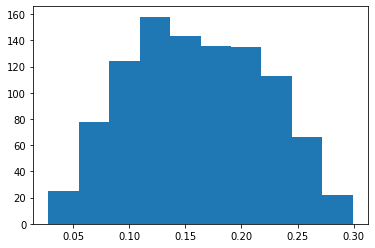

In [22]:
plt.hist(ttcost)

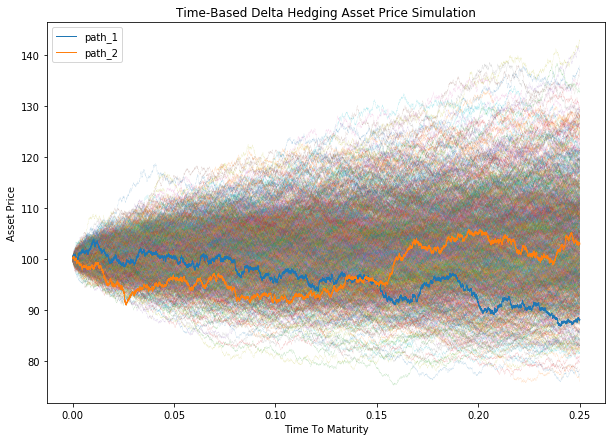

In [23]:
paths_to_show = (1,2)

plt.figure(figsize=(10,7))
plt.plot(t,S.T,linewidth=0.05)
plt.plot(t,S[1,:].T,linewidth=1,label='path_1')
plt.plot(t,S[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Asset Price')
plt.title('Time-Based Delta Hedging Asset Price Simulation')
plt.legend(loc=2)
plt.savefig('1_tb_d_ap.png')

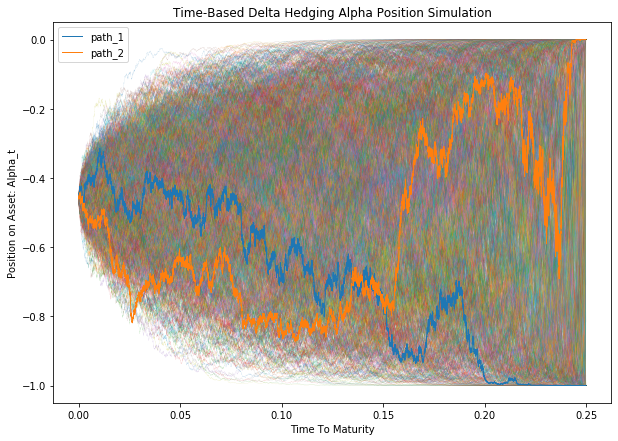

In [24]:
plt.figure(figsize=(10,7))
plt.plot(t,alpha.T,linewidth=0.05)
plt.plot(t,alpha[1,:].T,linewidth=1,label='path_1')
plt.plot(t,alpha[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Position on Asset: Alpha_t')
plt.title('Time-Based Delta Hedging Alpha Position Simulation')
plt.legend(loc=2)
plt.savefig('1_tb_d_alpha.png')

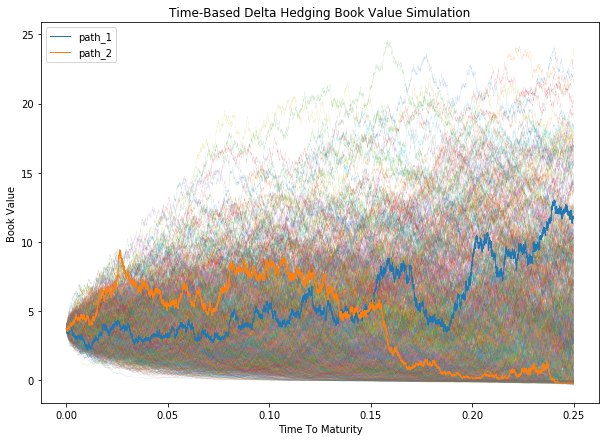

In [25]:
plt.figure(figsize=(10,7))
plt.plot(t,BV.T,linewidth=0.05)
plt.plot(t,BV[1,:].T,linewidth=1,label='path_1')
plt.plot(t,BV[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Book Value')
plt.title('Time-Based Delta Hedging Book Value Simulation')
plt.legend(loc=2)
plt.savefig('1_tb_d_bv.png')

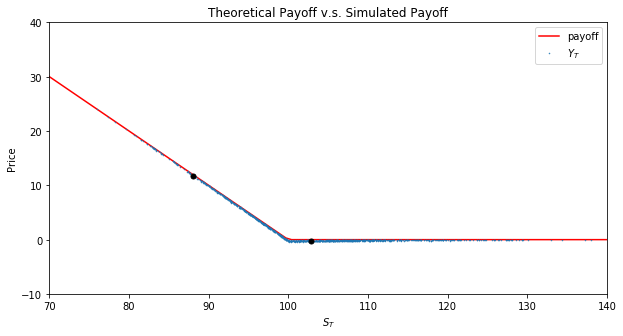

In [26]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(70,140,100), np.maximum(K-np.linspace(70,140,100),0),'-r', label='payoff')
plt.plot(S[:,-1], Y[:,-1],'.',markersize=1, label='$Y_T$')
plt.plot(S[paths_to_show,-1], Y[paths_to_show,-1],'ok',markersize=5)
plt.xlabel('$S_T$')
plt.ylabel('Price')
plt.title('Theoretical Payoff v.s. Simulated Payoff')
plt.ylim(-10,40)
plt.xlim(70,140)
plt.legend()
plt.savefig('1_tb_d_po.png')

In [27]:
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

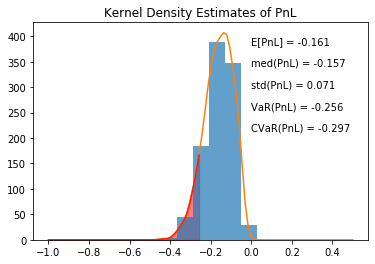

In [34]:
fig = plt.figure()
ax = fig.add_subplot(111)

ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-1,0.5,20)
ax.hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-1,0.5,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax.plot(kde_bins, kde)

ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax.set_title('Kernel Density Estimates of PnL')
fig.savefig('1_tb_d_kde.png')
#report compare VaR and CVaR under diff Ndts


In [61]:
# real-world P volatility is = 15% but the risk-neutral Q volatility is = 20%
mu = 0.1
r = 0.02
sigma_P = 0.15
sigma_Q = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100
trans_cost_asset = 0.005

Nsims = 1000

t, S, Y, alpha, BV, PnL, ttc = DeltaTimeHedge(S0, mu, sigma_P, sigma_Q, r, K, T, Ndt, Nsims, trans_cost_asset)


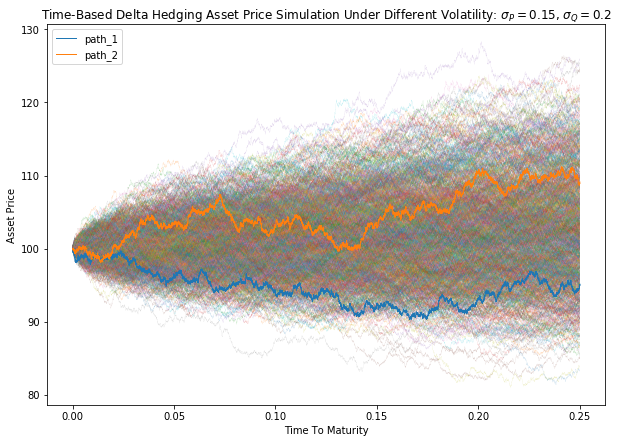

In [62]:
paths_to_show = (1,2)

plt.figure(figsize=(10,7))
plt.plot(t,S.T,linewidth=0.05)
plt.plot(t,S[1,:].T,linewidth=1,label='path_1')
plt.plot(t,S[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Asset Price')
plt.title('Time-Based Delta Hedging Asset Price Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.savefig('3_tb_d_ap.png')

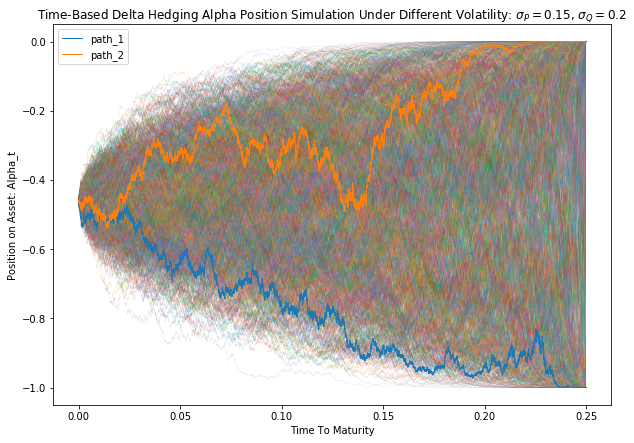

<Figure size 432x288 with 0 Axes>

In [63]:
plt.figure(figsize=(10,7))
plt.plot(t,alpha.T,linewidth=0.05)
plt.plot(t,alpha[1,:].T,linewidth=1,label='path_1')
plt.plot(t,alpha[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Position on Asset: Alpha_t')
plt.title('Time-Based Delta Hedging Alpha Position Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.show()
plt.savefig('3_tb_d_alpha.png')

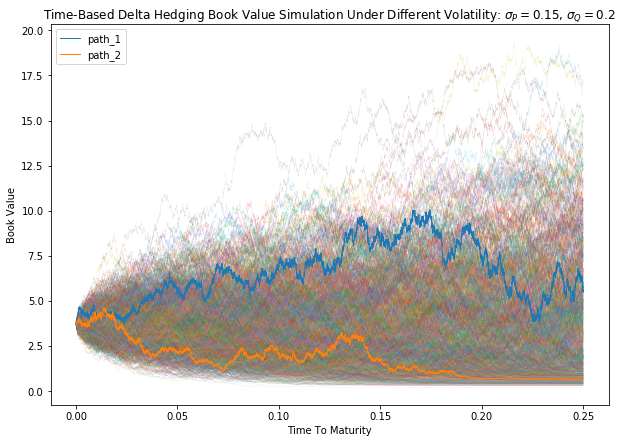

<Figure size 432x288 with 0 Axes>

In [64]:
plt.figure(figsize=(10,7))
plt.plot(t,BV.T,linewidth=0.05)
plt.plot(t,BV[1,:].T,linewidth=1,label='path_1')
plt.plot(t,BV[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Book Value')
plt.title('Time-Based Delta Hedging Book Value Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.show()
plt.savefig('3_tb_d_bv.png')

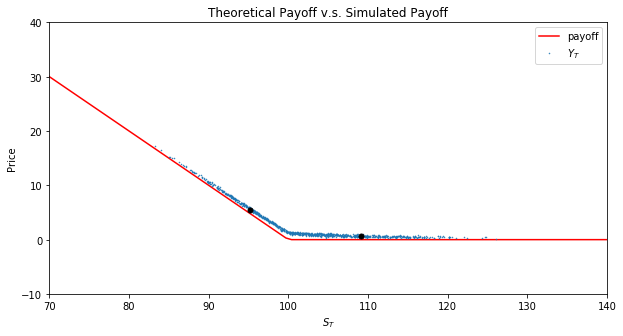

<Figure size 432x288 with 0 Axes>

In [65]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(70,140,100), np.maximum(K-np.linspace(70,140,100),0),'-r', label='payoff')
plt.plot(S[:,-1], Y[:,-1],'.',markersize=1, label='$Y_T$')
plt.plot(S[paths_to_show,-1], Y[paths_to_show,-1],'ok',markersize=5)
plt.xlabel('$S_T$')
plt.ylabel('Price')
plt.title('Theoretical Payoff v.s. Simulated Payoff')
plt.ylim(-10,40)
plt.xlim(70,140)
plt.legend()
plt.show()
plt.savefig('3_tb_d_po.png')

In [66]:
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

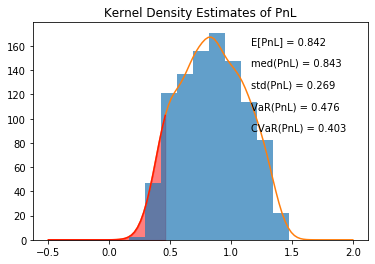

In [67]:
fig = plt.figure()
ax = fig.add_subplot(111)

ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-0.5,2,20)
ax.hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-0.5,2,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax.plot(kde_bins, kde)

ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax.set_title('Kernel Density Estimates of PnL')
fig.savefig('3_tb_d_kde.png')

In [45]:
# 2. Move based delta
# band = 0.05/2 = 0.025
mu = 0.1
r = 0.02
sigma = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100


Nsims = 1000

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.025)
#print ("t:\n ",t, " \n S: \n", S, " \n Y: \n", Y, " \n alpha: \n", alpha, " \n BV: \n", BV, " \n PnL: \n", PnL)

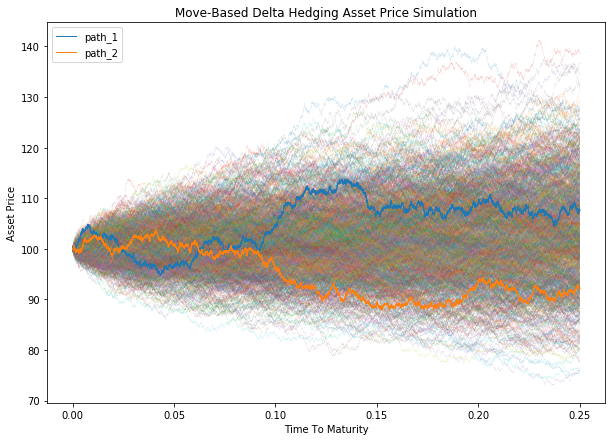

In [47]:
paths_to_show = (1,2)

plt.figure(figsize=(10,7))
plt.plot(t,S.T,linewidth=0.05)
plt.plot(t,S[1,:].T,linewidth=1,label='path_1')
plt.plot(t,S[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Asset Price')
plt.title('Move-Based Delta Hedging Asset Price Simulation')
plt.legend(loc=2)
plt.savefig('1_mb_d_ap.png')

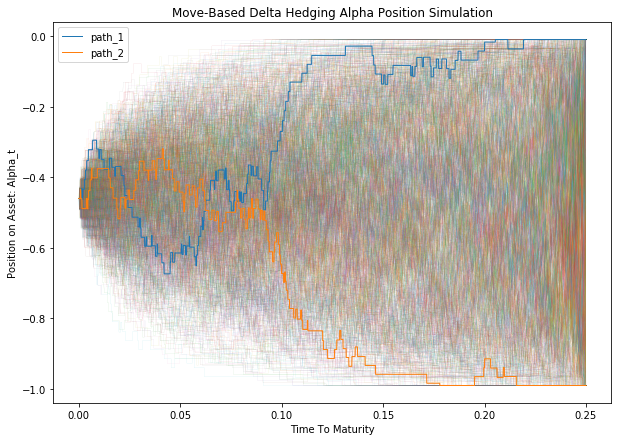

In [48]:
plt.figure(figsize=(10,7))
plt.plot(t,alpha.T,linewidth=0.05)
plt.plot(t,alpha[1,:].T,linewidth=1,label='path_1')
plt.plot(t,alpha[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Position on Asset: Alpha_t')
plt.title('Move-Based Delta Hedging Alpha Position Simulation')
plt.legend(loc=2)
plt.savefig('1_mb_d_alpha.png')

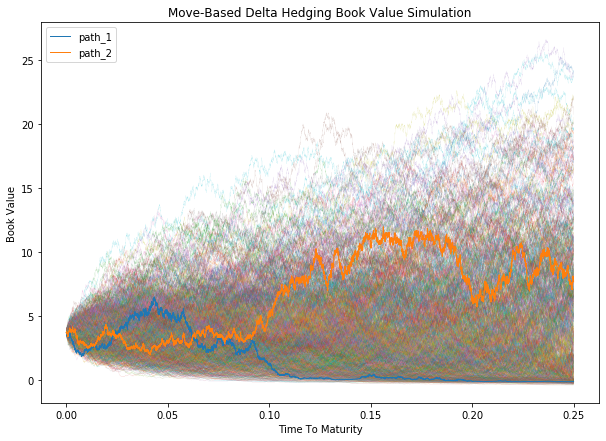

In [49]:
plt.figure(figsize=(10,7))
plt.plot(t,BV.T,linewidth=0.05)
plt.plot(t,BV[1,:].T,linewidth=1,label='path_1')
plt.plot(t,BV[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Book Value')
plt.title('Move-Based Delta Hedging Book Value Simulation')
plt.legend(loc=2)
plt.savefig('1_mb_d_bv.png')

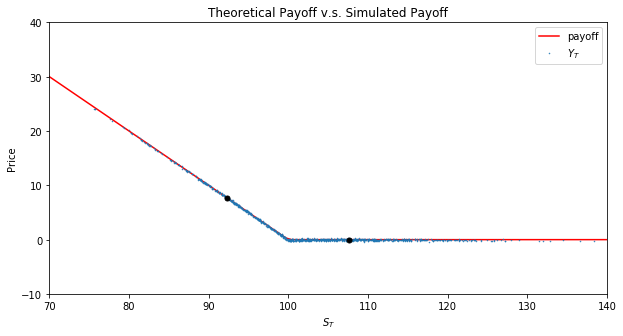

In [50]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(70,140,100), np.maximum(K-np.linspace(70,140,100),0),'-r', label='payoff')
plt.plot(S[:,-1], Y[:,-1],'.',markersize=1, label='$Y_T$')
plt.plot(S[paths_to_show,-1], Y[paths_to_show,-1],'ok',markersize=5)
plt.xlabel('$S_T$')
plt.ylabel('Price')
plt.title('Theoretical Payoff v.s. Simulated Payoff')
plt.ylim(-10,40)
plt.xlim(70,140)
plt.legend()
plt.savefig('1_mb_d_po.png')

In [51]:
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

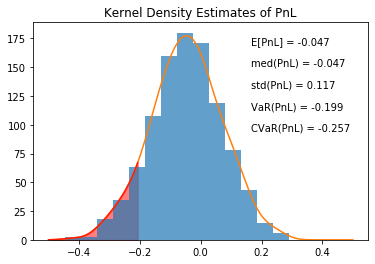

In [52]:
fig = plt.figure()
ax = fig.add_subplot(111)

ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-0.5,0.5,20)
ax.hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-0.5,0.5,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax.plot(kde_bins, kde)

ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax.set_title('Kernel Density Estimates of PnL')
fig.savefig('1_mb_d_kde.png')

In [68]:
# real-world P volatility is = 15% but the risk-neutral Q volatility is = 20%
mu = 0.1
r = 0.02
sigma_P = 0.15
sigma_Q = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100
trans_cost_asset = 0.005
band = 0.025

Nsims = 1000

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(S0, mu, sigma_P, sigma_Q, r, K, T, Ndt, Nsims, trans_cost_asset, band)

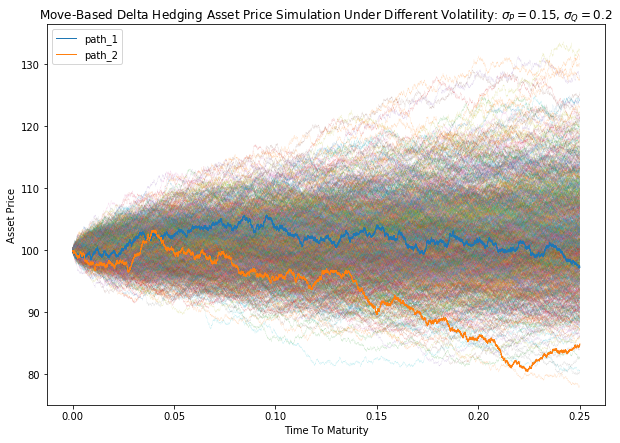

In [69]:
paths_to_show = (1,2)

plt.figure(figsize=(10,7))
plt.plot(t,S.T,linewidth=0.05)
plt.plot(t,S[1,:].T,linewidth=1,label='path_1')
plt.plot(t,S[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Asset Price')
plt.title('Move-Based Delta Hedging Asset Price Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.savefig('3_mb_d_ap.png')

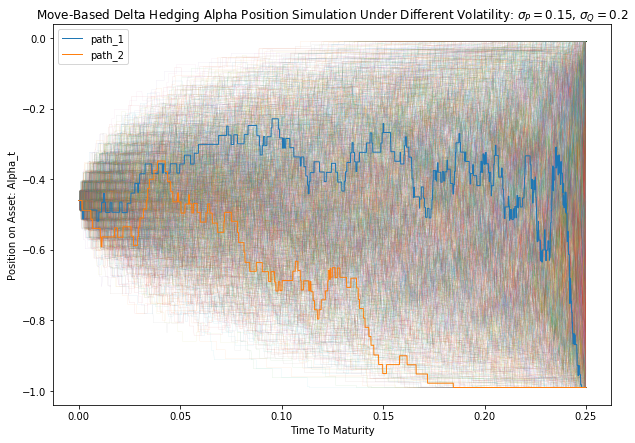

In [70]:
plt.figure(figsize=(10,7))
plt.plot(t,alpha.T,linewidth=0.05)
plt.plot(t,alpha[1,:].T,linewidth=1,label='path_1')
plt.plot(t,alpha[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Position on Asset: Alpha_t')
plt.title('Move-Based Delta Hedging Alpha Position Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.savefig('3_mb_d_alpha.png')

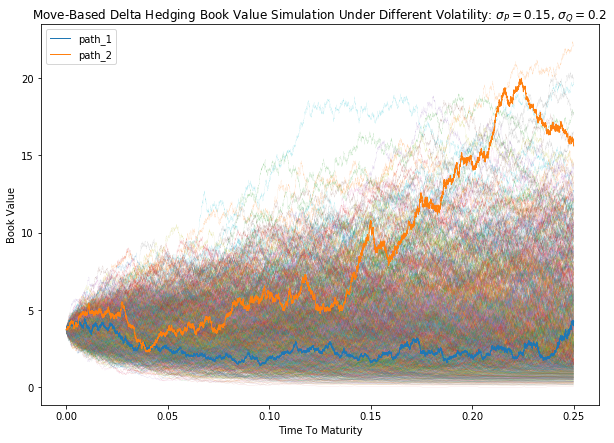

In [71]:
plt.figure(figsize=(10,7))
plt.plot(t,BV.T,linewidth=0.05)
plt.plot(t,BV[1,:].T,linewidth=1,label='path_1')
plt.plot(t,BV[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Book Value')
plt.title('Move-Based Delta Hedging Book Value Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.savefig('3_mb_d_bv.png')

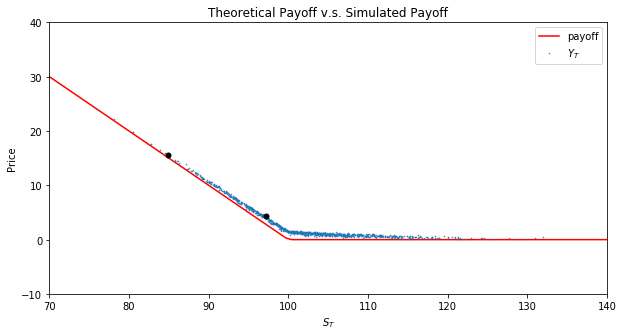

In [72]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(70,140,100), np.maximum(K-np.linspace(70,140,100),0),'-r', label='payoff')
plt.plot(S[:,-1], Y[:,-1],'.',markersize=1, label='$Y_T$')
plt.plot(S[paths_to_show,-1], Y[paths_to_show,-1],'ok',markersize=5)
plt.xlabel('$S_T$')
plt.ylabel('Price')
plt.title('Theoretical Payoff v.s. Simulated Payoff')
plt.ylim(-10,40)
plt.xlim(70,140)
plt.legend()
plt.savefig('3_mb_d_po.png')

In [73]:
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

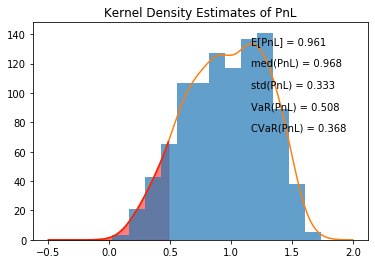

In [74]:
fig = plt.figure()
ax = fig.add_subplot(111)

ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-0.5,2,20)
ax.hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-0.5,2,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax.plot(kde_bins, kde)

ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax.set_title('Kernel Density Estimates of PnL')
fig.savefig('3_mb_d_kde.png')

In [75]:
# Investigate the role that the rebalancing-band plays on the hedge.
mu = 0.1
r = 0.02
sigma = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100


Nsims = 1000

halfband = [0.005, 0.025, 0.1, 0.25]

#plt.subplot(2,2,halfband.index(i)+1)

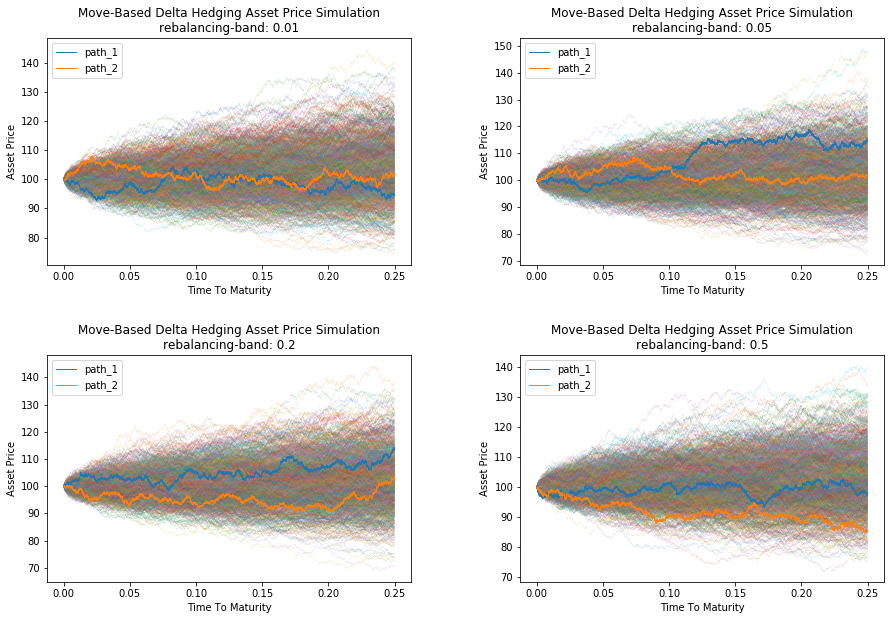

In [76]:
fig, ax = plt.subplots(2,2,figsize=(15,10))
plt.subplots_adjust(hspace=0.4,wspace=0.3)

paths_to_show = (1,2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.005)
ax[0,0].plot(t,S.T,linewidth=0.05)
ax[0,0].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[0,0].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[0,0].set_xlabel('Time To Maturity')
ax[0,0].set_ylabel('Asset Price')
ax[0,0].set_title('Move-Based Delta Hedging Asset Price Simulation\nrebalancing-band: 0.01')
ax[0,0].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.025)
ax[0,1].plot(t,S.T,linewidth=0.05)
ax[0,1].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[0,1].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[0,1].set_xlabel('Time To Maturity')
ax[0,1].set_ylabel('Asset Price')
ax[0,1].set_title('Move-Based Delta Hedging Asset Price Simulation\nrebalancing-band: 0.05')
ax[0,1].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.1)
ax[1,0].plot(t,S.T,linewidth=0.05)
ax[1,0].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[1,0].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[1,0].set_xlabel('Time To Maturity')
ax[1,0].set_ylabel('Asset Price')
ax[1,0].set_title('Move-Based Delta Hedging Asset Price Simulation\nrebalancing-band: 0.2')
ax[1,0].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.25)
ax[1,1].plot(t,S.T,linewidth=0.05)
ax[1,1].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[1,1].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[1,1].set_xlabel('Time To Maturity')
ax[1,1].set_ylabel('Asset Price')
ax[1,1].set_title('Move-Based Delta Hedging Asset Price Simulation\nrebalancing-band: 0.5')
ax[1,1].legend(loc=2)

fig.savefig('4_mb_d_ap.png')

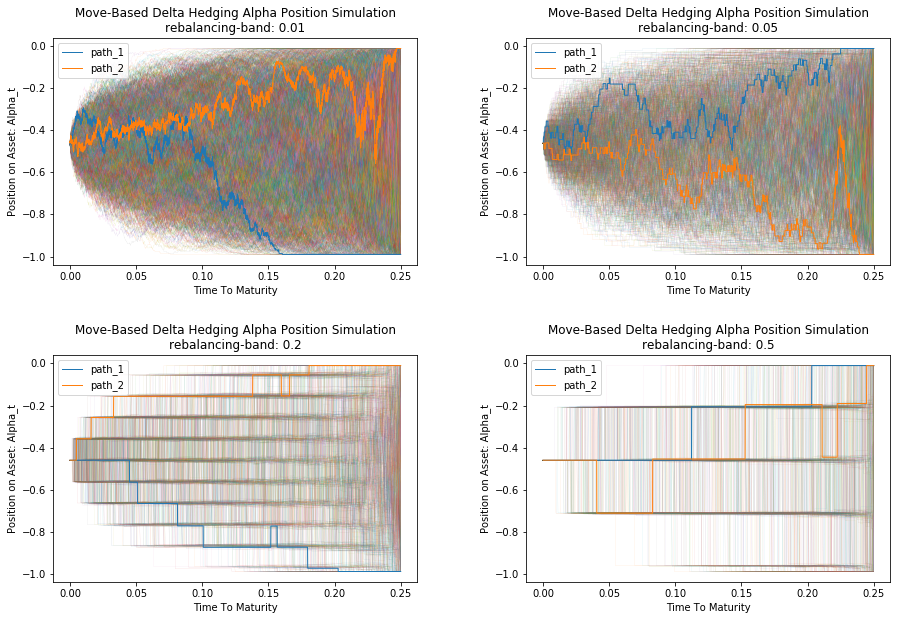

In [77]:
fig, ax = plt.subplots(2,2,figsize=(15,10))
plt.subplots_adjust(hspace=0.4,wspace=0.3)

paths_to_show = (1,2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.005)
ax[0,0].plot(t,alpha.T,linewidth=0.05)
ax[0,0].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[0,0].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[0,0].set_xlabel('Time To Maturity')
ax[0,0].set_ylabel('Position on Asset: Alpha_t')
ax[0,0].set_title('Move-Based Delta Hedging Alpha Position Simulation\nrebalancing-band: 0.01')
ax[0,0].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.025)
ax[0,1].plot(t,alpha.T,linewidth=0.05)
ax[0,1].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[0,1].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[0,1].set_xlabel('Time To Maturity')
ax[0,1].set_ylabel('Position on Asset: Alpha_t')
ax[0,1].set_title('Move-Based Delta Hedging Alpha Position Simulation\nrebalancing-band: 0.05')
ax[0,1].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.1)
ax[1,0].plot(t,alpha.T,linewidth=0.05)
ax[1,0].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[1,0].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[1,0].set_xlabel('Time To Maturity')
ax[1,0].set_ylabel('Position on Asset: Alpha_t')
ax[1,0].set_title('Move-Based Delta Hedging Alpha Position Simulation\nrebalancing-band: 0.2')
ax[1,0].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.25)
ax[1,1].plot(t,alpha.T,linewidth=0.05)
ax[1,1].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[1,1].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[1,1].set_xlabel('Time To Maturity')
ax[1,1].set_ylabel('Position on Asset: Alpha_t')
ax[1,1].set_title('Move-Based Delta Hedging Alpha Position Simulation\nrebalancing-band: 0.5')
ax[1,1].legend(loc=2)

fig.savefig('4_mb_d_alpha.png')

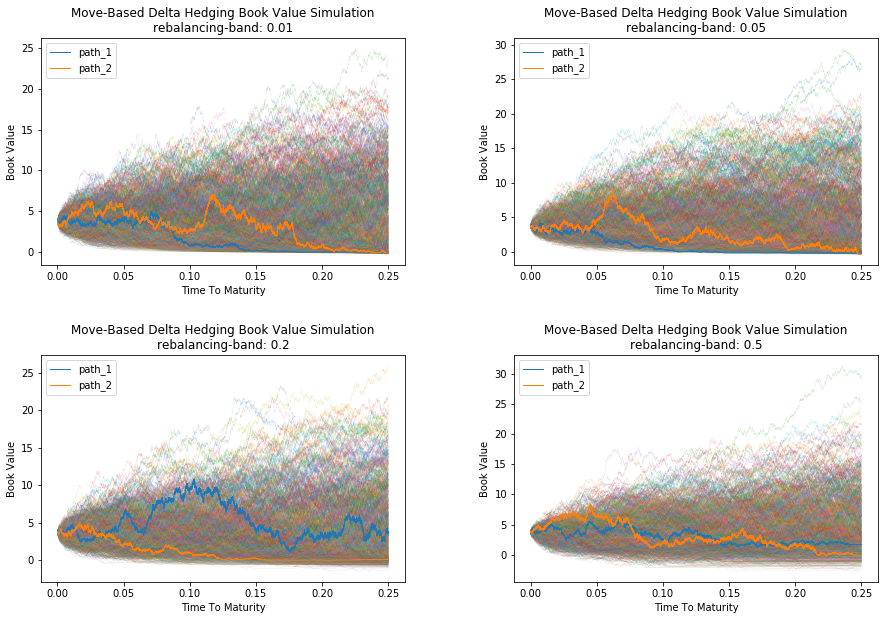

In [78]:
fig, ax = plt.subplots(2,2,figsize=(15,10))
plt.subplots_adjust(hspace=0.4,wspace=0.3)

paths_to_show = (1,2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.005)
ax[0,0].plot(t,BV.T,linewidth=0.05)
ax[0,0].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[0,0].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[0,0].set_xlabel('Time To Maturity')
ax[0,0].set_ylabel('Book Value')
ax[0,0].set_title('Move-Based Delta Hedging Book Value Simulation\nrebalancing-band: 0.01')
ax[0,0].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.025)
ax[0,1].plot(t,BV.T,linewidth=0.05)
ax[0,1].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[0,1].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[0,1].set_xlabel('Time To Maturity')
ax[0,1].set_ylabel('Book Value')
ax[0,1].set_title('Move-Based Delta Hedging Book Value Simulation\nrebalancing-band: 0.05')
ax[0,1].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.1)
ax[1,0].plot(t,BV.T,linewidth=0.05)
ax[1,0].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[1,0].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[1,0].set_xlabel('Time To Maturity')
ax[1,0].set_ylabel('Book Value')
ax[1,0].set_title('Move-Based Delta Hedging Book Value Simulation\nrebalancing-band: 0.2')
ax[1,0].legend(loc=2)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.25)
ax[1,1].plot(t,BV.T,linewidth=0.05)
ax[1,1].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[1,1].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[1,1].set_xlabel('Time To Maturity')
ax[1,1].set_ylabel('Book Value')
ax[1,1].set_title('Move-Based Delta Hedging Book Value Simulation\nrebalancing-band: 0.5')
ax[1,1].legend(loc=2)

fig.savefig('4_mb_d_bv.png')

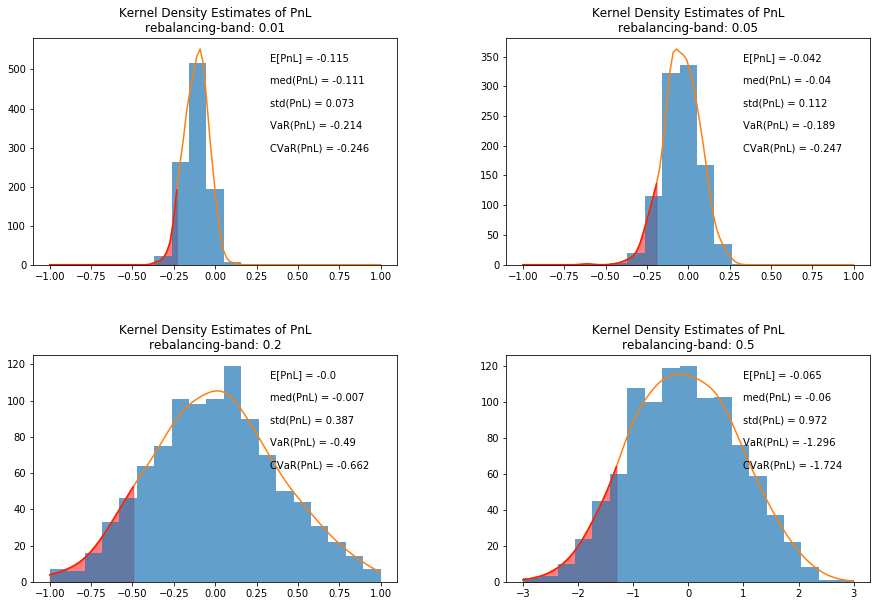

In [82]:
fig, ax = plt.subplots(2,2,figsize=(15,10))
plt.subplots_adjust(hspace=0.4,wspace=0.3)

t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.005)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[0,0].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[0,0].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[0,0].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[0,0].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[0,0].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-1,1,20)
ax[0,0].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-1,1,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[0,0].plot(kde_bins, kde)

ax[0,0].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[0,0].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[0,0].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.01')



t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.025)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[0,1].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[0,1].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[0,1].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[0,1].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[0,1].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-1,1,20)
ax[0,1].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-1,1,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[0,1].plot(kde_bins, kde)

ax[0,1].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[0,1].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[0,1].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.05')


t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.1)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[1,0].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[1,0].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[1,0].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[1,0].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[1,0].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-1,1,20)
ax[1,0].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-1,1,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[1,0].plot(kde_bins, kde)

ax[1,0].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[1,0].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[1,0].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.2')


t, S, Y, alpha, BV, PnL, ttc = DeltaMoveHedge(100, mu, sigma, sigma, r, K, T, Ndt, Nsims, 0.005, 0.25)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[1,1].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[1,1].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[1,1].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[1,1].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[1,1].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-3,3,20)
ax[1,1].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-3,3,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[1,1].plot(kde_bins, kde)

ax[1,1].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[1,1].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[1,1].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.5')

fig.savefig('4_mb_d_kde.png')

In [83]:
# 3. Time based gamma
mu = 0.1
r = 0.02
sigma = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100


Nsims = 1000

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaTimeHedge(100, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, 0.005, 0.01)

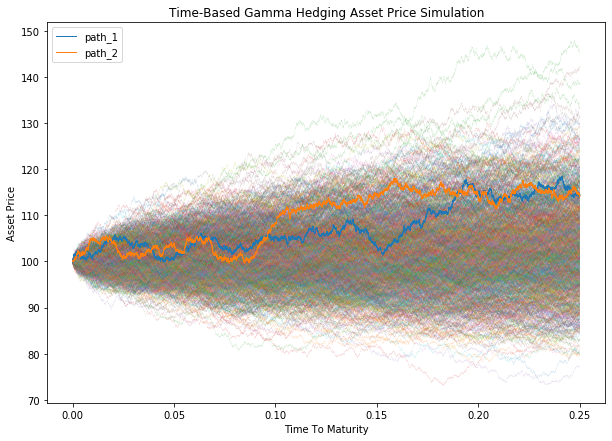

In [84]:
paths_to_show = (1,2)

plt.figure(figsize=(10,7))
plt.plot(t,S.T,linewidth=0.05)
plt.plot(t,S[1,:].T,linewidth=1,label='path_1')
plt.plot(t,S[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Asset Price')
plt.title('Time-Based Gamma Hedging Asset Price Simulation')
plt.legend(loc=2)
plt.savefig('2_tb_g_ap.png')

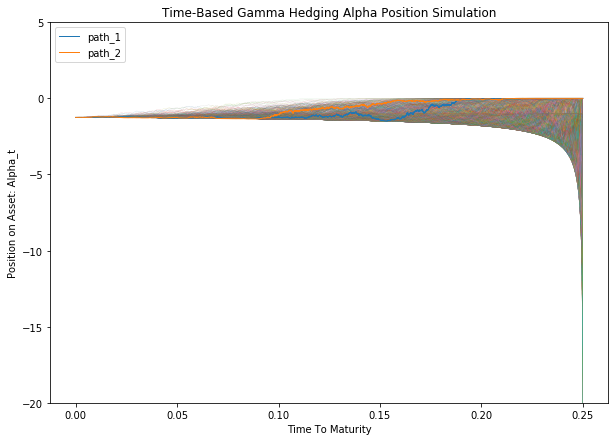

<Figure size 432x288 with 0 Axes>

In [90]:
plt.figure(figsize=(10,7))
plt.plot(t,alpha.T,linewidth=0.05)
plt.plot(t,alpha[1,:].T,linewidth=1,label='path_1')
plt.plot(t,alpha[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Position on Asset: Alpha_t')
plt.ylim(-20,5)
plt.title('Time-Based Gamma Hedging Alpha Position Simulation')
plt.legend(loc=2)
plt.show()
plt.savefig('2_tb_g_alpha.png')

In [89]:
#from scipy import stats
#stats.describe(alpha[:,-2])         


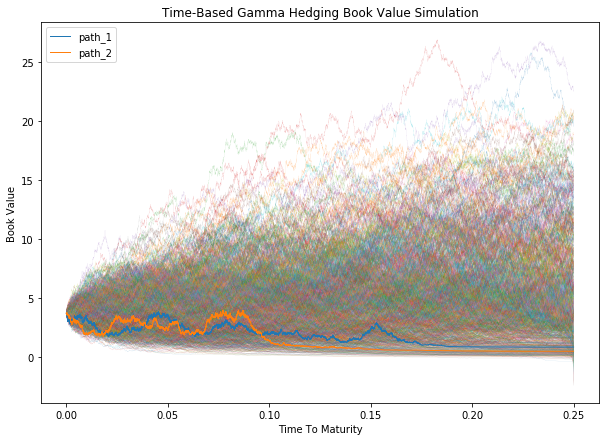

In [91]:
plt.figure(figsize=(10,7))
plt.plot(t,BV.T,linewidth=0.05)
plt.plot(t,BV[1,:].T,linewidth=1,label='path_1')
plt.plot(t,BV[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Book Value')
plt.title('Time-Based Gamma Hedging Book Value Simulation')
plt.legend(loc=2)
plt.savefig('2_tb_g_bv.png')

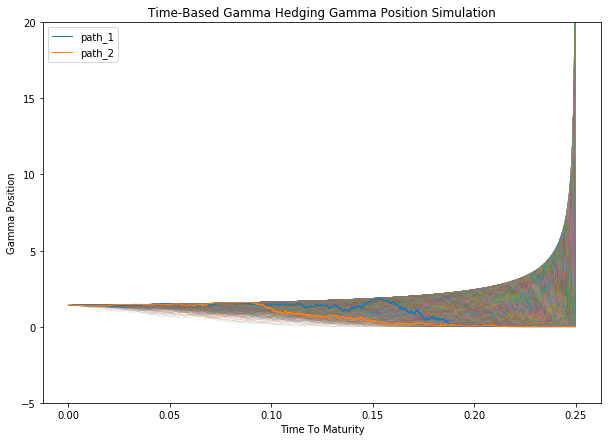

In [93]:
plt.figure(figsize=(10,7))
plt.plot(t,gamma.T,linewidth=0.05)
plt.plot(t,gamma[1,:].T,linewidth=1,label='path_1')
plt.plot(t,gamma[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Gamma Position')
plt.ylim(-5,20)
plt.title('Time-Based Gamma Hedging Gamma Position Simulation')
plt.legend(loc=2)
plt.savefig('2_tb_g_ga.png')

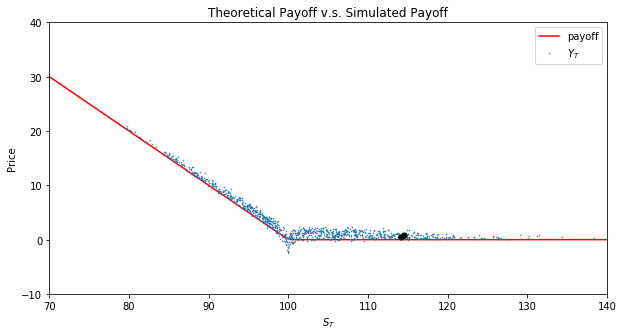

In [94]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(70,140,100), np.maximum(K-np.linspace(70,140,100),0),'-r', label='payoff')
plt.plot(S[:,-1], Y[:,-1],'.',markersize=1, label='$Y_T$')
plt.plot(S[paths_to_show,-1], Y[paths_to_show,-1],'ok',markersize=5)
plt.xlabel('$S_T$')
plt.ylabel('Price')
plt.title('Theoretical Payoff v.s. Simulated Payoff')
plt.ylim(-10,40)
plt.xlim(70,140)
plt.legend()
plt.savefig('2_tb_g_po.png')

In [95]:
#mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

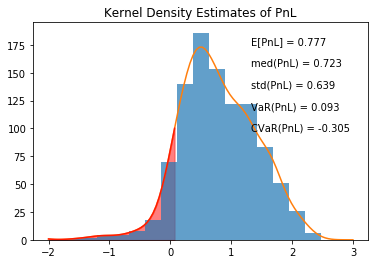

In [97]:
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)
fig = plt.figure()
ax = fig.add_subplot(111)

ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-2,3,20)
ax.hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-2,3,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax.plot(kde_bins, kde)

ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax.set_title('Kernel Density Estimates of PnL')
fig.savefig('2_tb_g_kde.png')

In [98]:
# real-world P volatility is = 15% but the risk-neutral Q volatility is = 20%
mu = 0.1
r = 0.02
sigma_P = 0.15
sigma_Q = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100


Nsims = 1000

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaTimeHedge(100, mu, sigma_P, sigma_Q, r, K, T, 0.5, Ndt, Nsims, 0.005, 0.01)

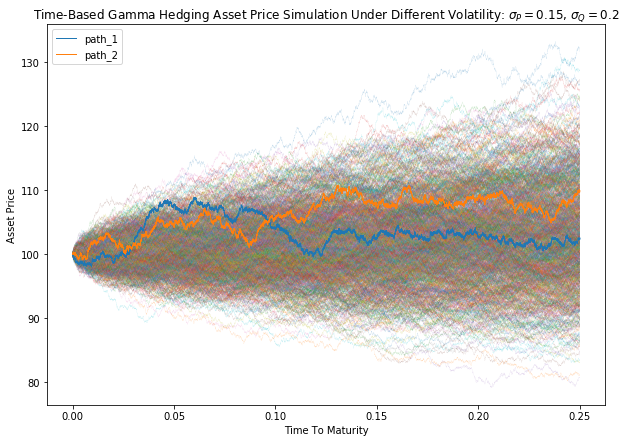

In [99]:
paths_to_show = (1,2)

plt.figure(figsize=(10,7))
plt.plot(t,S.T,linewidth=0.05)
plt.plot(t,S[1,:].T,linewidth=1,label='path_1')
plt.plot(t,S[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Asset Price')
plt.title('Time-Based Gamma Hedging Asset Price Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.savefig('3_tb_g_ap.png')

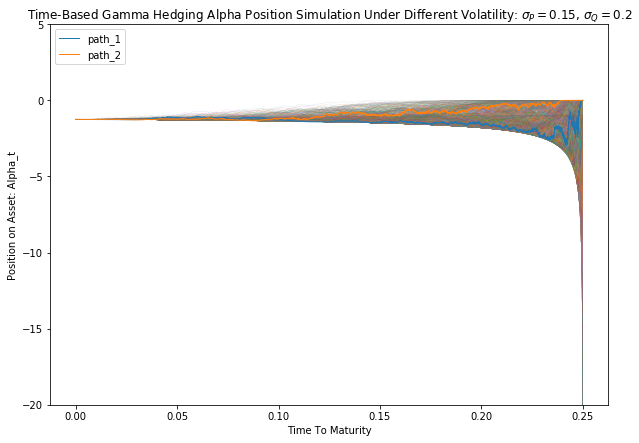

<Figure size 432x288 with 0 Axes>

In [101]:
plt.figure(figsize=(10,7))
plt.plot(t,alpha.T,linewidth=0.05)
plt.plot(t,alpha[1,:].T,linewidth=1,label='path_1')
plt.plot(t,alpha[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Position on Asset: Alpha_t')
plt.ylim(-20,5)
plt.title('Time-Based Gamma Hedging Alpha Position Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.show()
plt.savefig('3_tb_g_alpha.png')

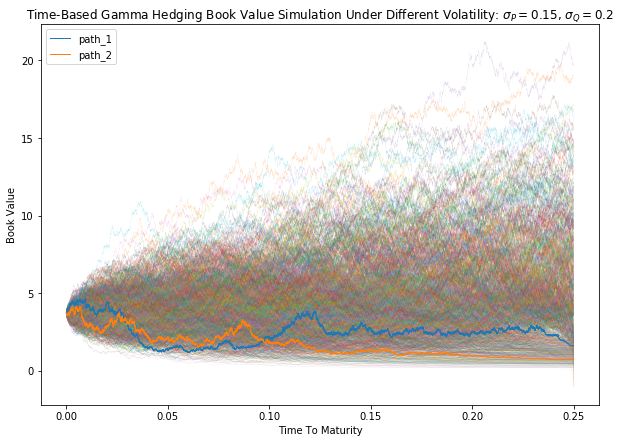

<Figure size 432x288 with 0 Axes>

In [102]:
plt.figure(figsize=(10,7))
plt.plot(t,BV.T,linewidth=0.05)
plt.plot(t,BV[1,:].T,linewidth=1,label='path_1')
plt.plot(t,BV[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Book Value')
plt.title('Time-Based Gamma Hedging Book Value Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.show()
plt.savefig('3_tb_g_bv.png')

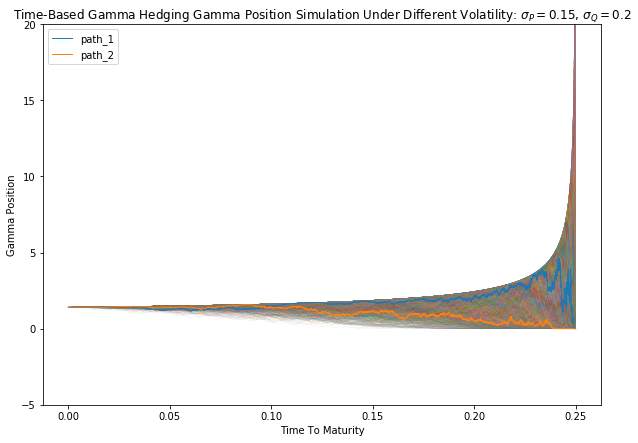

In [103]:
plt.figure(figsize=(10,7))
plt.plot(t,gamma.T,linewidth=0.05)
plt.plot(t,gamma[1,:].T,linewidth=1,label='path_1')
plt.plot(t,gamma[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Gamma Position')
plt.ylim(-5,20)
plt.title('Time-Based Gamma Hedging Gamma Position Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.savefig('3_tb_g_ga.png')

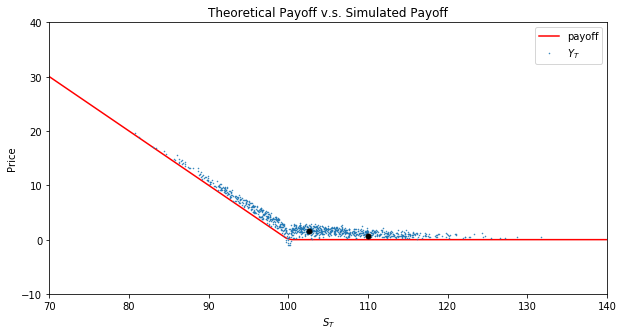

In [104]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(70,140,100), np.maximum(K-np.linspace(70,140,100),0),'-r', label='payoff')
plt.plot(S[:,-1], Y[:,-1],'.',markersize=1, label='$Y_T$')
plt.plot(S[paths_to_show,-1], Y[paths_to_show,-1],'ok',markersize=5)
plt.xlabel('$S_T$')
plt.ylabel('Price')
plt.title('Theoretical Payoff v.s. Simulated Payoff')
plt.ylim(-10,40)
plt.xlim(70,140)
plt.legend()
plt.savefig('3_tb_g_po.png')

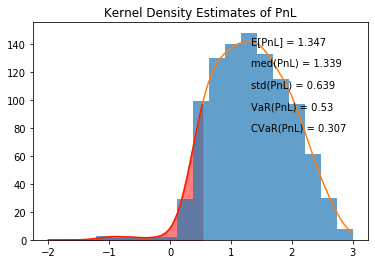

In [105]:
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)
fig = plt.figure()
ax = fig.add_subplot(111)

ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-2,3,20)
ax.hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-2,3,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax.plot(kde_bins, kde)

ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax.set_title('Kernel Density Estimates of PnL')
fig.savefig('3_tb_g_kde.png')

In [108]:
# 4.Move based gamma
mu = 0.1
r = 0.02
sigma = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100

trans_cost_asset = 0.005
trans_cost_option = 0.01

Nsims = 1000

halfband = [0.005, 0.025, 0.05, 0.1, 0.15, 0.25]
#band 0.01,0.05,0.1,0.2,0.3,0.5

In [109]:
t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.025)

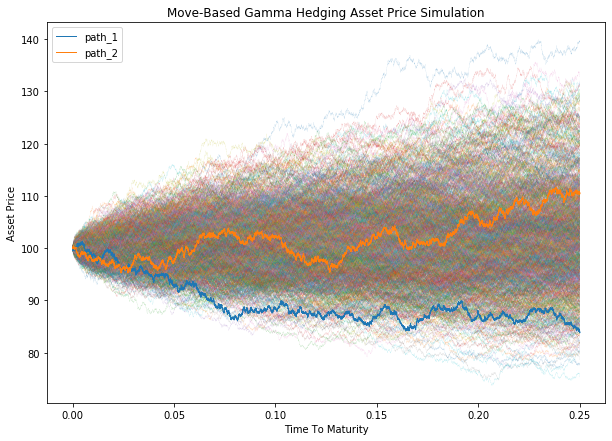

In [110]:
paths_to_show = (1,2)

plt.figure(figsize=(10,7))
plt.plot(t,S.T,linewidth=0.05)
plt.plot(t,S[1,:].T,linewidth=1,label='path_1')
plt.plot(t,S[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Asset Price')
plt.title('Move-Based Gamma Hedging Asset Price Simulation')
plt.legend(loc=2)
plt.savefig('2_mb_g_ap.png')

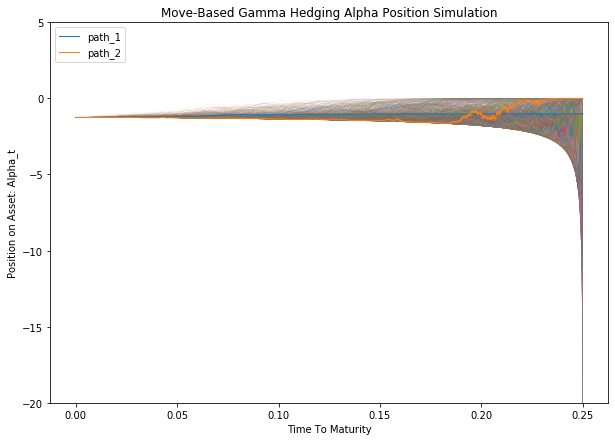

<Figure size 432x288 with 0 Axes>

In [111]:
plt.figure(figsize=(10,7))
plt.plot(t,alpha.T,linewidth=0.05)
plt.plot(t,alpha[1,:].T,linewidth=1,label='path_1')
plt.plot(t,alpha[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Position on Asset: Alpha_t')
plt.ylim(-20,5)
plt.title('Move-Based Gamma Hedging Alpha Position Simulation')
plt.legend(loc=2)
plt.show()
plt.savefig('2_mb_g_alpha.png')

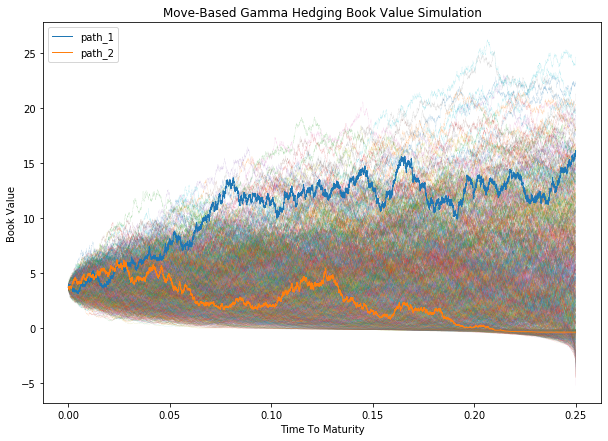

<Figure size 432x288 with 0 Axes>

In [112]:
plt.figure(figsize=(10,7))
plt.plot(t,BV.T,linewidth=0.05)
plt.plot(t,BV[1,:].T,linewidth=1,label='path_1')
plt.plot(t,BV[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Book Value')
plt.title('Move-Based Gamma Hedging Book Value Simulation')
plt.legend(loc=2)
plt.show()
plt.savefig('2_mb_g_bv.png')

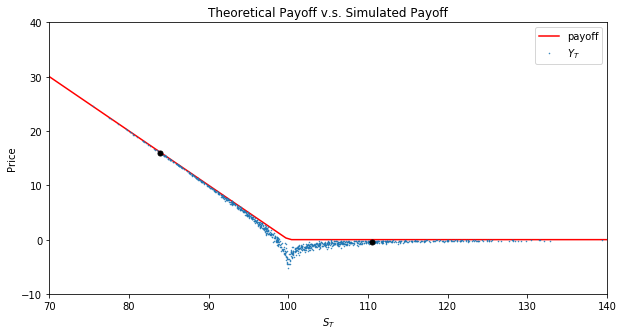

In [113]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(70,140,100), np.maximum(K-np.linspace(70,140,100),0),'-r', label='payoff')
plt.plot(S[:,-1], Y[:,-1],'.',markersize=1, label='$Y_T$')
plt.plot(S[paths_to_show,-1], Y[paths_to_show,-1],'ok',markersize=5)
plt.xlabel('$S_T$')
plt.ylabel('Price')
plt.title('Theoretical Payoff v.s. Simulated Payoff')
plt.ylim(-10,40)
plt.xlim(70,140)
plt.legend()
plt.savefig('2_mb_g_po.png')

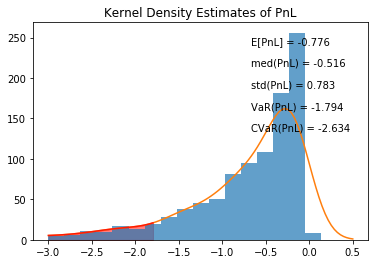

In [114]:
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)
fig = plt.figure()
ax = fig.add_subplot(111)

ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-3,0.5,20)
ax.hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-3,0.5,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax.plot(kde_bins, kde)

ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax.set_title('Kernel Density Estimates of PnL')
fig.savefig('2_mb_g_kde.png')

In [138]:
#mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

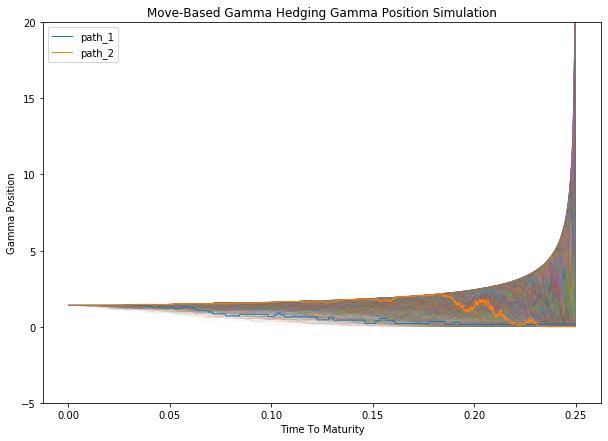

In [115]:
plt.figure(figsize=(10,7))
plt.plot(t,gamma.T,linewidth=0.05)
plt.plot(t,gamma[1,:].T,linewidth=1,label='path_1')
plt.plot(t,gamma[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Gamma Position')
plt.ylim(-5,20)
plt.title('Move-Based Gamma Hedging Gamma Position Simulation')
plt.legend(loc=2)
plt.savefig('2_mb_g_ga.png')

In [117]:
# real-world P volatility is = 15% but the risk-neutral Q volatility is = 20%
mu = 0.1
r = 0.02
sigma_P = 0.15
sigma_Q = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100


Nsims = 1000

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(100, mu, sigma_P, sigma_Q, r, K, T, 0.5, Ndt, Nsims, 0.005, 0.01, 0.025)

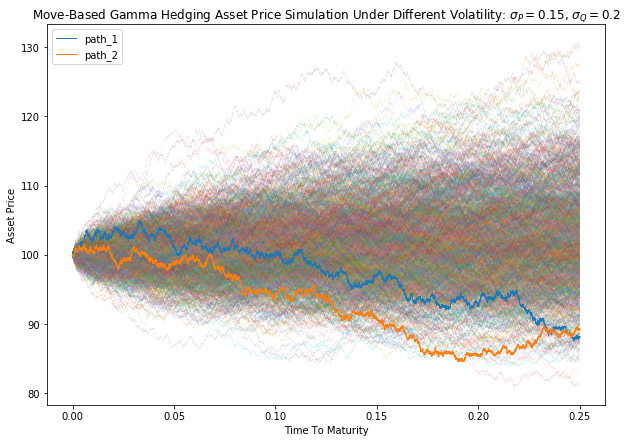

In [118]:
paths_to_show = (1,2)

plt.figure(figsize=(10,7))
plt.plot(t,S.T,linewidth=0.05)
plt.plot(t,S[1,:].T,linewidth=1,label='path_1')
plt.plot(t,S[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Asset Price')
plt.title('Move-Based Gamma Hedging Asset Price Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.savefig('3_mb_g_ap.png')

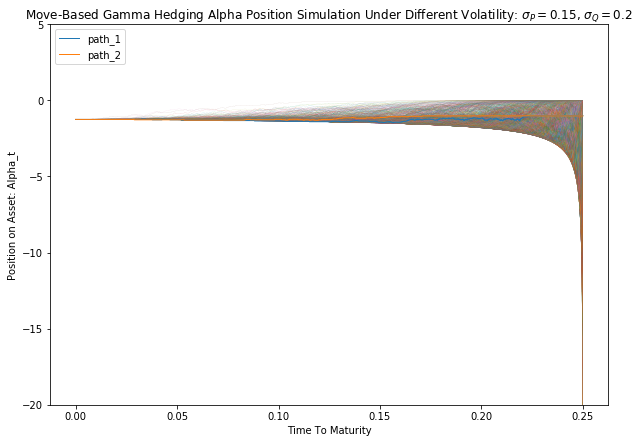

<Figure size 432x288 with 0 Axes>

In [119]:
plt.figure(figsize=(10,7))
plt.plot(t,alpha.T,linewidth=0.05)
plt.plot(t,alpha[1,:].T,linewidth=1,label='path_1')
plt.plot(t,alpha[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Position on Asset: Alpha_t')
plt.ylim(-20,5)
plt.title('Move-Based Gamma Hedging Alpha Position Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.show()
plt.savefig('3_mb_g_alpha.png')

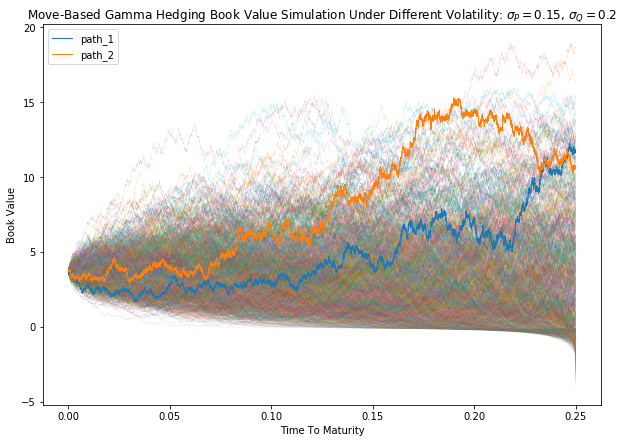

<Figure size 432x288 with 0 Axes>

In [120]:
plt.figure(figsize=(10,7))
plt.plot(t,BV.T,linewidth=0.05)
plt.plot(t,BV[1,:].T,linewidth=1,label='path_1')
plt.plot(t,BV[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Book Value')
plt.title('Move-Based Gamma Hedging Book Value Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.show()
plt.savefig('3_mb_g_bv.png')

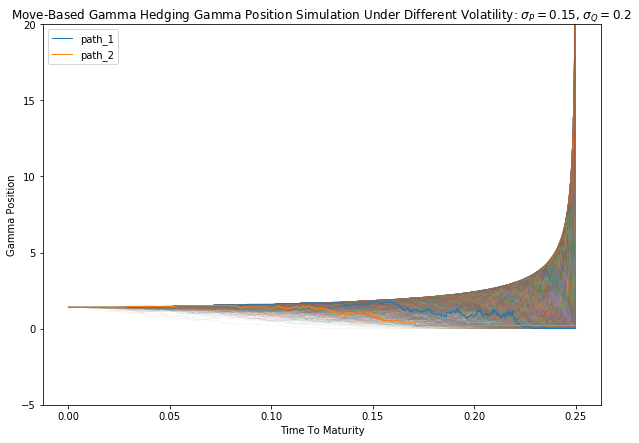

In [121]:
plt.figure(figsize=(10,7))
plt.plot(t,gamma.T,linewidth=0.05)
plt.plot(t,gamma[1,:].T,linewidth=1,label='path_1')
plt.plot(t,gamma[2,:].T,linewidth=1,label='path_2')
plt.xlabel('Time To Maturity')
plt.ylabel('Gamma Position')
plt.ylim(-5,20)
plt.title('Move-Based Gamma Hedging Gamma Position Simulation Under Different Volatility: $\sigma_P=0.15$, $\sigma_Q=0.2$')
plt.legend(loc=2)
plt.savefig('3_mb_g_ga.png')

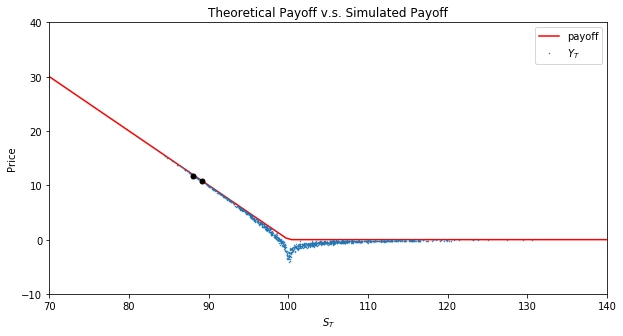

In [122]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(70,140,100), np.maximum(K-np.linspace(70,140,100),0),'-r', label='payoff')
plt.plot(S[:,-1], Y[:,-1],'.',markersize=1, label='$Y_T$')
plt.plot(S[paths_to_show,-1], Y[paths_to_show,-1],'ok',markersize=5)
plt.xlabel('$S_T$')
plt.ylabel('Price')
plt.title('Theoretical Payoff v.s. Simulated Payoff')
plt.ylim(-10,40)
plt.xlim(70,140)
plt.legend()
plt.savefig('3_mb_g_po.png')

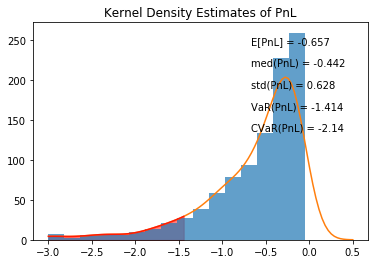

In [124]:
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)
fig = plt.figure()
ax = fig.add_subplot(111)

ax.annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax.annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax.annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax.annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax.annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-3,0.5,20)
ax.hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-3,0.5,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax.plot(kde_bins, kde)

ax.plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax.fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax.set_title('Kernel Density Estimates of PnL')
fig.savefig('3_mb_g_kde.png')

In [125]:
# Investigate the role that the rebalancing-band plays on the hedge.
mu = 0.1
r = 0.02
sigma = 0.2
T = 0.25
Ndt = 10000

S0 = 100
K = 100

trans_cost_asset = 0.005
trans_cost_option = 0.01

Nsims = 1000

halfband = [0.005, 0.025, 0.05, 0.1, 0.15, 0.25]
#band 0.01,0.05,0.1,0.2,0.3,0.5

In [126]:
#t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.025)

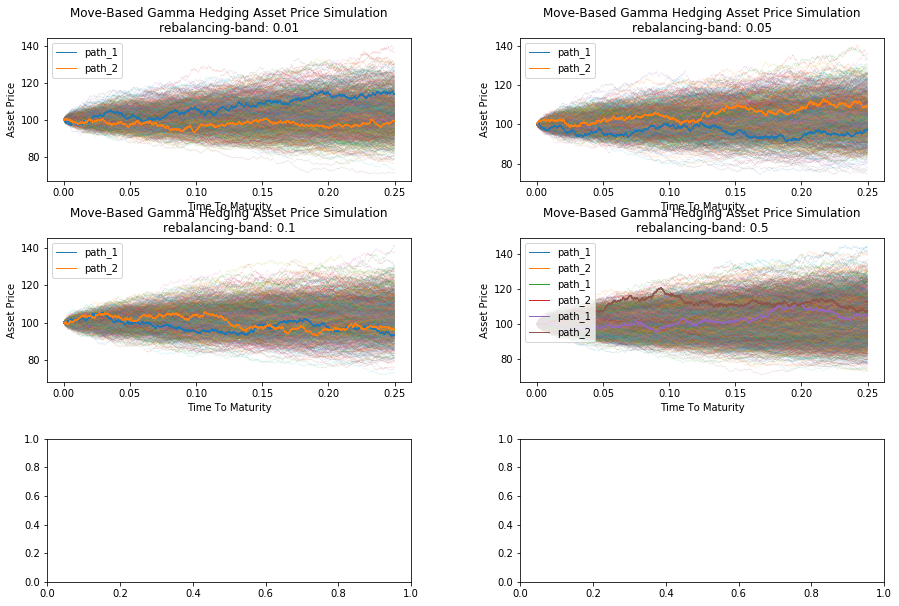

In [127]:
fig, ax = plt.subplots(3,2,figsize=(15,10))
plt.subplots_adjust(hspace=0.4,wspace=0.3)

paths_to_show = (1,2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.005)
ax[0,0].plot(t,S.T,linewidth=0.05)
ax[0,0].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[0,0].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[0,0].set_xlabel('Time To Maturity')
ax[0,0].set_ylabel('Asset Price')
ax[0,0].set_title('Move-Based Gamma Hedging Asset Price Simulation\nrebalancing-band: 0.01')
ax[0,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.025)
ax[0,1].plot(t,S.T,linewidth=0.05)
ax[0,1].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[0,1].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[0,1].set_xlabel('Time To Maturity')
ax[0,1].set_ylabel('Asset Price')
ax[0,1].set_title('Move-Based Gamma Hedging Asset Price Simulation\nrebalancing-band: 0.05')
ax[0,1].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.05)
ax[1,0].plot(t,S.T,linewidth=0.05)
ax[1,0].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[1,0].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[1,0].set_xlabel('Time To Maturity')
ax[1,0].set_ylabel('Asset Price')
ax[1,0].set_title('Move-Based Gamma Hedging Asset Price Simulation\nrebalancing-band: 0.1')
ax[1,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.1)
ax[1,1].plot(t,S.T,linewidth=0.05)
ax[1,1].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[1,1].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[1,1].set_xlabel('Time To Maturity')
ax[1,1].set_ylabel('Asset Price')
ax[1,1].set_title('Move-Based Gamma Hedging Asset Price Simulation\nrebalancing-band: 0.2')
ax[1,1].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.15)
ax[2,0].plot(t,S.T,linewidth=0.05)
ax[2,0].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[2,0].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[2,0].set_xlabel('Time To Maturity')
ax[2,0].set_ylabel('Asset Price')
ax[2,0].set_title('Move-Based Gamma Hedging Asset Price Simulation\nrebalancing-band: 0.3')
ax[2,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.25)
ax[2,1].plot(t,S.T,linewidth=0.05)
ax[2,1].plot(t,S[1,:].T,linewidth=1,label='path_1')
ax[2,1].plot(t,S[2,:].T,linewidth=1,label='path_2')
ax[2,1].set_xlabel('Time To Maturity')
ax[2,1].set_ylabel('Asset Price')
ax[2,1].set_title('Move-Based Gamma Hedging Asset Price Simulation\nrebalancing-band: 0.5')
ax[2,1].legend(loc=2)


fig.savefig('4_mb_g_ap.png')

In [ ]:
fig, ax = plt.subplots(3,2,figsize=(15,10))
plt.subplots_adjust(hspace=0.4,wspace=0.3)

paths_to_show = (1,2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.005)
ax[0,0].plot(t,alpha.T,linewidth=0.05)
ax[0,0].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[0,0].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[0,0].set_xlabel('Time To Maturity')
ax[0,0].set_ylabel('Alpha Position')
ax[0,0].set_title('Move-Based Gamma Hedging Alpha Position Simulation\nrebalancing-band: 0.01')
ax[0,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.025)
ax[0,1].plot(t,alpha.T,linewidth=0.05)
ax[0,1].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[0,1].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[0,1].set_xlabel('Time To Maturity')
ax[0,1].set_ylabel('Alpha Position')
ax[0,1].set_title('Move-Based Gamma Hedging Alpha Position Simulation\nrebalancing-band: 0.05')
ax[0,1].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.05)
ax[1,0].plot(t,alpha.T,linewidth=0.05)
ax[1,0].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[1,0].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[1,0].set_xlabel('Time To Maturity')
ax[1,0].set_ylabel('Alpha Position')
ax[1,0].set_title('Move-Based Gamma Hedging Alpha Position Simulation\nrebalancing-band: 0.1')
ax[1,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.1)
ax[1,1].plot(t,alpha.T,linewidth=0.05)
ax[1,1].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[1,1].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[1,1].set_xlabel('Time To Maturity')
ax[1,1].set_ylabel('Alpha Position')
ax[1,1].set_title('Move-Based Gamma Hedging Alpha Position Simulation\nrebalancing-band: 0.2')
ax[1,1].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.15)
ax[2,0].plot(t,alpha.T,linewidth=0.05)
ax[2,0].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[2,0].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[2,0].set_xlabel('Time To Maturity')
ax[2,0].set_ylabel('Alpha Position')
ax[2,0].set_title('Move-Based Gamma Hedging Alpha Position Simulation\nrebalancing-band: 0.3')
ax[2,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.25)
ax[2,1].plot(t,alpha.T,linewidth=0.05)
ax[2,1].plot(t,alpha[1,:].T,linewidth=1,label='path_1')
ax[2,1].plot(t,alpha[2,:].T,linewidth=1,label='path_2')
ax[2,1].set_xlabel('Time To Maturity')
ax[2,1].set_ylabel('Alpha Position')
ax[2,1].set_title('Move-Based Gamma Hedging Alpha Position Simulation\nrebalancing-band: 0.5')
ax[2,1].legend(loc=2)


fig.savefig('4_mb_g_alpha.png')

In [ ]:
fig, ax = plt.subplots(3,2,figsize=(15,10))
plt.subplots_adjust(hspace=0.4,wspace=0.3)

paths_to_show = (1,2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.005)
ax[0,0].plot(t,BV.T,linewidth=0.05)
ax[0,0].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[0,0].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[0,0].set_xlabel('Time To Maturity')
ax[0,0].set_ylabel('Book Value')
ax[0,0].set_title('Move-Based Gamma Hedging Book Value Simulation\nrebalancing-band: 0.01')
ax[0,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.025)
ax[0,1].plot(t,BV.T,linewidth=0.05)
ax[0,1].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[0,1].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[0,1].set_xlabel('Time To Maturity')
ax[0,1].set_ylabel('Book Value')
ax[0,1].set_title('Move-Based Gamma Hedging Book Value Simulation\nrebalancing-band: 0.05')
ax[0,1].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.05)
ax[1,0].plot(t,BV.T,linewidth=0.05)
ax[1,0].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[1,0].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[1,0].set_xlabel('Time To Maturity')
ax[1,0].set_ylabel('Book Value')
ax[1,0].set_title('Move-Based Gamma Hedging Book Value Simulation\nrebalancing-band: 0.1')
ax[1,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.1)
ax[1,1].plot(t,BV.T,linewidth=0.05)
ax[1,1].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[1,1].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[1,1].set_xlabel('Time To Maturity')
ax[1,1].set_ylabel('Book Value')
ax[1,1].set_title('Move-Based Gamma Hedging Book Value Simulation\nrebalancing-band: 0.2')
ax[1,1].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.15)
ax[2,0].plot(t,BV.T,linewidth=0.05)
ax[2,0].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[2,0].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[2,0].set_xlabel('Time To Maturity')
ax[2,0].set_ylabel('Book Value')
ax[2,0].set_title('Move-Based Gamma Hedging Book Value Simulation\nrebalancing-band: 0.3')
ax[2,0].legend(loc=2)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.25)
ax[2,1].plot(t,BV.T,linewidth=0.05)
ax[2,1].plot(t,BV[1,:].T,linewidth=1,label='path_1')
ax[2,1].plot(t,BV[2,:].T,linewidth=1,label='path_2')
ax[2,1].set_xlabel('Time To Maturity')
ax[2,1].set_ylabel('Book Value')
ax[2,1].set_title('Move-Based Gamma Hedging Book Value Simulation\nrebalancing-band: 0.5')
ax[2,1].legend(loc=2)


fig.savefig('4_mb_g_bv.png')

In [ ]:
fig, ax = plt.subplots(3,2,figsize=(15,10))
plt.subplots_adjust(hspace=0.4,wspace=0.3)

t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.005)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[0,0].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[0,0].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[0,0].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[0,0].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[0,0].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-1,1,20)
ax[0,0].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-1,1,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[0,0].plot(kde_bins, kde)

ax[0,0].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[0,0].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[0,0].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.01')



t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.025)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[0,1].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[0,1].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[0,1].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[0,1].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[0,1].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-1,1,20)
ax[0,1].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-1,1,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[0,1].plot(kde_bins, kde)

ax[0,1].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[0,1].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[0,1].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.05')


t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.05)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[1,0].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[1,0].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[1,0].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[1,0].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[1,0].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-1,1,20)
ax[1,0].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-1,1,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[1,0].plot(kde_bins, kde)

ax[1,0].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[1,0].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[1,0].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.1')


t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.1)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[1,1].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[1,1].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[1,1].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[1,1].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[1,1].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-3,3,20)
ax[1,1].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-3,3,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[1,1].plot(kde_bins, kde)

ax[1,1].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[1,1].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[1,1].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.2')


t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.15)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[2,0].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[2,0].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[2,0].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[2,0].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[2,0].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-3,3,20)
ax[2,0].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-3,3,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[2,0].plot(kde_bins, kde)

ax[2,0].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[2,0].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[2,0].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.3')


t, S, Y, alpha, gamma, BV, PnL, ttc = GammaMoveHedge(S0, mu, sigma, sigma, r, K, T, 0.5, Ndt, Nsims, trans_cost_asset, trans_cost_option, 0.25)
mean_PnL, med_PnL, std_PnL, VaR, CVaR = ComputeMetrics(PnL)

ax[2,1].annotate('E[PnL] = ' + str(round(mean_PnL,3)), xy=(0.65,0.9), xycoords='axes fraction')
ax[2,1].annotate('med(PnL) = ' + str(round(med_PnL,3)), xy=(0.65,0.8), xycoords='axes fraction')
ax[2,1].annotate('std(PnL) = ' + str(round(std_PnL,3)), xy=(0.65,0.7), xycoords='axes fraction')
ax[2,1].annotate('VaR(PnL) = ' + str(round(VaR,3)), xy=(0.65,0.6), xycoords='axes fraction')
ax[2,1].annotate('CVaR(PnL) = ' + str(round(CVaR,3)), xy=(0.65,0.5), xycoords='axes fraction')

    
hist_bins = np.linspace(-3,3,20)
ax[2,1].hist(PnL, bins=hist_bins, alpha=0.7)

kde_bins = np.linspace(-3,3,100)
kde = KDE(PnL, kde_bins)*Nsims*(hist_bins[1]-hist_bins[0])
ax[2,1].plot(kde_bins, kde)

ax[2,1].plot(kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.8)

ax[2,1].fill_between( kde_bins[kde_bins<=VaR], kde[kde_bins<=VaR], color="red", alpha=0.5)
    
ax[2,1].set_title('Kernel Density Estimates of PnL\nrebalancing-band: 0.5')


fig.savefig('4_mb_g_kde.png')